# Py-ART Animation
### Choosing the radar volume from a Nexrad site over a time span. 

### Based on code by Scott Collis: https://github.com/scollis/radar_in_the_cloud/blob/master/notebooks/Matthew.ipynb 

### and Jonathan Helmus: https://anaconda.org/jjhelmus/scipy2015_openaccessradar_jjh/notebook

In [1]:
from boto.s3.connection import S3Connection
import pyart
import gzip
from matplotlib import pyplot as plt
import shutil, os
from datetime import date, datetime, timedelta
import glob
from matplotlib import animation
import tempfile
import numpy as np
from IPython.display import Image
from IPython.display import display
%matplotlib inline
%install_ext https://raw.github.com/cpcloud/ipython-autotime/master/autotime.py
%load_ext autotime

/home/zsherman/anaconda3/lib/python3.5/site-packages/pyart/map/grid_mapper.py:40: DeprecationWarning: inspect.getargspec() is deprecated, use inspect.signature() instead
  from .ball_tree import BallTree
/home/zsherman/anaconda3/lib/python3.5/site-packages/ipykernel/pylab/config.py:66: DeprecationWarning: metadata {'config': True} was set from the constructor.  Metadata should be set using the .tag() method, e.g., Int().tag(key1='value1', key2='value2')
  inline backend."""
/home/zsherman/anaconda3/lib/python3.5/site-packages/ipykernel/pylab/config.py:71: DeprecationWarning: metadata {'config': True} was set from the constructor.  Metadata should be set using the .tag() method, e.g., Int().tag(key1='value1', key2='value2')
  'retina', 'jpeg', 'svg', 'pdf'.""")
/home/zsherman/anaconda3/lib/python3.5/site-packages/ipykernel/pylab/config.py:85: DeprecationWarning: metadata {'config': True} was set from the constructor.  Metadata should be set using the .tag() method, e.g., Int().tag(key1=

Installed autotime.py. To use it, type:
  %load_ext autotime


In [2]:
def nearestDate(dates, pivot):
    return min(dates, key=lambda x: abs(x - pivot))

def get_radar_from_aws(site, datetime_t):
    """
    Get the closest volume of NEXRAD data to a particular datetime.
    Parameters
    ----------
    site : string
        four letter radar designation 
    datetime_t : datetime
        desired date time
    """
    
    #First create the query string for the bucket knowing
    #how NOAA and AWS store the data
    
    my_pref = datetime_t.strftime('%Y/%m/%d/') + site
    
    #Connect to the bucket
    
    conn = S3Connection(anon = True)
    bucket = conn.get_bucket('noaa-nexrad-level2')
    
    #Get a list of files 
    
    bucket_list = list(bucket.list(prefix = my_pref))
    
    #we are going to create a list of keys and datetimes to allow easy searching
    
    keys = []
    datetimes = []
    
    #populate the list

    for i in range(len(bucket_list)):
        this_str = str(bucket_list[i].key)
        if 'gz' in this_str:
            endme = this_str[-22:-3]
            fmt = '%Y%m%d_%H%M%S_V06' 
            dt = datetime.strptime(endme, fmt)
            datetimes.append(dt)
            keys.append(bucket_list[i])
            #print(dt)
            
        if this_str[-3::] == 'V06':    
            endme = this_str[-19::]
            fmt = '%Y%m%d_%H%M%S_V06' 
            dt = datetime.strptime(endme, fmt)
            datetimes.append(dt)
            keys.append(bucket_list[i])
        
    
    #function to allow easy searching 
    
    def func(x):
        delta =  x - datetime_t if x > datetime_t else timedelta.max
        return delta
    
    #find the closest available radar to your datetime 
    
    closest_datetime = nearestDate(datetimes, datetime_t)
    index = datetimes.index(closest_datetime)
    #print(closest_datetime)
    #create a temp file, download radar data to file from S3
    #read into a radar object and return
    
    #LOCAL_PATH = '/home/zsherman/practice/data/
    localfile = tempfile.NamedTemporaryFile()
    keys[index].get_contents_to_filename(localfile.name)
    
    radar = pyart.io.read_nexrad_archive(localfile.name, scans=[0, 1])
    return radar

time: 61.5 ms


In [3]:
#format for start and end date = '20160525_195000'
def nexrad_site_datetime_span(start_date, end_date, time_interval, site):
    
    """
    Get all volumes of NEXRAD data between two particular dates at a set interval.
    Parameters
    ----------
    
    start_date : string
        desire start time in format '%Y%m%d_%H%M%S', 
        for example 20151005_143005, October 5th 2015 at 2:30:05 P.M.
    end_date : datetime
        desired end time in format '%Y%m%d_%H%M%S'
    time_interval : float
        how often data is retrieved between the two datetimes
    site : string
        four letter radar designation in CAPS
        
    """

    
    def datespan(startDate, endDate, delta=timedelta(days=1)):
        currentDate = startDate
        while currentDate < endDate:
            yield currentDate
            currentDate += delta
    
    fmt = '%Y%m%d_%H%M%S' 
    start_date = start_date
    s_d = datetime.strptime(start_date, fmt)
    end_date = end_date
    e_d = datetime.strptime(end_date, fmt)

    times = []
    for timestamp in datespan((s_d), (e_d), delta=timedelta(hours=time_interval)):
        time = timestamp
        times += [time]
    print(times)
    
    my_radars = [get_radar_from_aws(site, time) for time in times]
    return my_radars

# radars = [pyart.io.read(filename, scans=scans) for filename in filenames]

time: 20.8 ms


In [4]:
# We have our functions, now lets choose a datespan, 
# how often between the datespan, volumes of data are read through py-art, and a nexrad site.
#Let's choose Hurricane Matthews as it approaches Miami.

my_radars_kamx = nexrad_site_datetime_span('20161006_175000', '20161007_045000',
                                           .333, 'KAMX')
for my_radar_kamx in my_radars_kamx:
    #nyq = my_radar.instrument_parameters['nyquist_velocity']['data'][0]
    gatefilter = pyart.correct.GateFilter(my_radar_kamx)
    gatefilter.exclude_masked('reflectivity')
    corr_vel = pyart.correct.dealias_region_based(
    my_radar_kamx, vel_field='velocity', keep_original=False, 
    gatefilter = gatefilter, nyquist_vel=33.01, centered = True)
    my_radar_kamx.add_field('corrected_velocity', corr_vel, replace_existing = True)

[datetime.datetime(2016, 10, 6, 17, 50), datetime.datetime(2016, 10, 6, 18, 9, 58, 800000), datetime.datetime(2016, 10, 6, 18, 29, 57, 600000), datetime.datetime(2016, 10, 6, 18, 49, 56, 400000), datetime.datetime(2016, 10, 6, 19, 9, 55, 200000), datetime.datetime(2016, 10, 6, 19, 29, 54), datetime.datetime(2016, 10, 6, 19, 49, 52, 800000), datetime.datetime(2016, 10, 6, 20, 9, 51, 600000), datetime.datetime(2016, 10, 6, 20, 29, 50, 400000), datetime.datetime(2016, 10, 6, 20, 49, 49, 200000), datetime.datetime(2016, 10, 6, 21, 9, 48), datetime.datetime(2016, 10, 6, 21, 29, 46, 800000), datetime.datetime(2016, 10, 6, 21, 49, 45, 600000), datetime.datetime(2016, 10, 6, 22, 9, 44, 400000), datetime.datetime(2016, 10, 6, 22, 29, 43, 200000), datetime.datetime(2016, 10, 6, 22, 49, 42), datetime.datetime(2016, 10, 6, 23, 9, 40, 800000), datetime.datetime(2016, 10, 6, 23, 29, 39, 600000), datetime.datetime(2016, 10, 6, 23, 49, 38, 400000), datetime.datetime(2016, 10, 7, 0, 9, 37, 200000), dat

In [5]:
#Now lets plot the mutiple radar objects
#one after another following time and run the matplotlib animation function.
max_lat = 31
min_lat = 23
min_lon = -84
max_lon = -76

lal = np.arange(min_lat, max_lat, 1)
lol = np.arange(min_lon, max_lon, 1)

def animate(nframe):
    plt.clf()
    display = pyart.graph.RadarMapDisplay(my_radars_kamx[nframe])
    display.plot_ppi_map('reflectivity', sweep=0, resolution='l',
                         vmin=-8, vmax=64, mask_outside=False,
                         cmap=pyart.graph.cm.NWSRef,
                         min_lat=min_lat, min_lon=min_lon,
                         max_lat=max_lat, max_lon=max_lon,
                         lat_lines=lal, lon_lines=lol)
    display.basemap.drawcounties()
    
fig = plt.figure(figsize=(10, 8))
anim_kamx = animation.FuncAnimation(fig, animate, frames=len(my_radars_kamx))
anim_kamx.save('/home/zsherman/pyart_animation/kamx_reflectivity_animation.gif', 
               writer='imagemagick', fps=5)
plt.close()

time: 3min 19s


/home/zsherman/anaconda3/lib/python3.5/site-packages/IPython/core/formatters.py:92: DeprecationWarning: DisplayFormatter._ipython_display_formatter_default is deprecated: use @default decorator instead.
  def _ipython_display_formatter_default(self):
/home/zsherman/anaconda3/lib/python3.5/site-packages/IPython/core/formatters.py:669: DeprecationWarning: PlainTextFormatter._singleton_printers_default is deprecated: use @default decorator instead.
  def _singleton_printers_default(self):


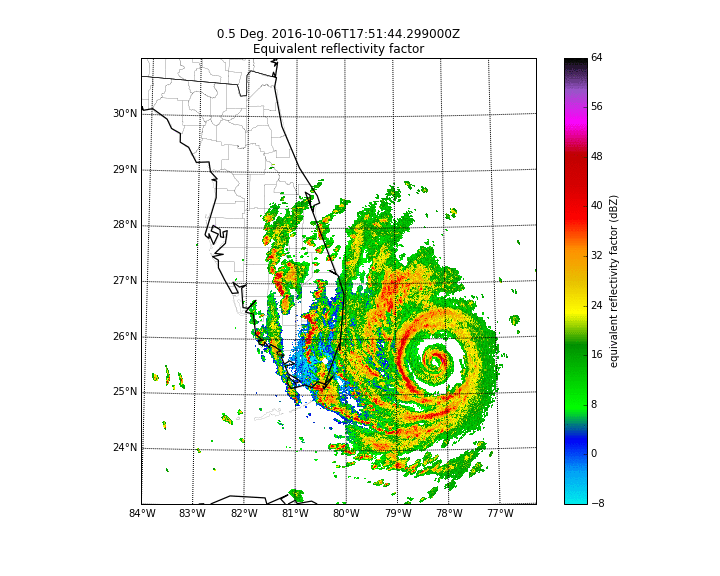

time: 56 ms


In [6]:
#The gifs created will not run inline in Jupyter Notebook unless the gif files are opened.
with open('/home/zsherman/pyart_animation/kamx_reflectivity_animation.gif','rb') as f:
    display(Image(f.read()), format='png')

In [7]:
def animate(nframe):
    plt.clf()
    display = pyart.graph.RadarMapDisplay(my_radars_kamx[nframe])
    display.plot_ppi_map('velocity', sweep=1, resolution='l',
                         vmin=-33, vmax=33, mask_outside=False,
                         cmap=pyart.graph.cm.NWSVel,
                         min_lat=min_lat, min_lon=min_lon,
                         max_lat=max_lat, max_lon=max_lon,
                         lat_lines=lal, lon_lines=lol)
    display.basemap.drawcounties()
    
fig = plt.figure(figsize=(10, 8))
anim_kamx = animation.FuncAnimation(fig, animate, frames=len(my_radars_kamx))
anim_kamx.save('/home/zsherman/pyart_animation/kamx_velocity_animation.gif', 
               writer='imagemagick', fps=5)
plt.close()

time: 3min 24s


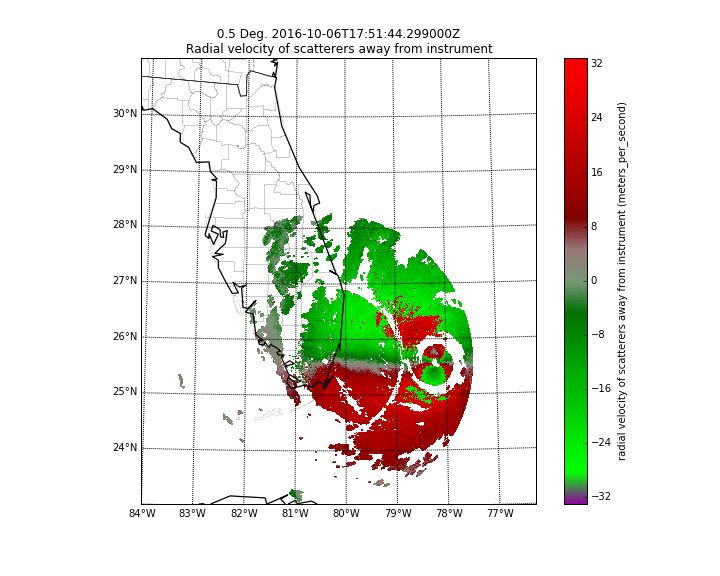

time: 42.8 ms


In [8]:
with open('/home/zsherman/pyart_animation/kamx_velocity_animation.gif','rb') as f:
    display(Image(f.read()), format='png')

In [9]:
def animate(nframe):
    plt.clf()
    display = pyart.graph.RadarMapDisplay(my_radars_kamx[nframe])
    display.plot_ppi_map('corrected_velocity', sweep=1, resolution='l',
                         vmin=-60, vmax=60, mask_outside=False,
                         cmap=pyart.graph.cm.NWSVel,
                         min_lat=min_lat, min_lon=min_lon,
                         max_lat=max_lat, max_lon=max_lon,
                         lat_lines=lal, lon_lines=lol)
    display.basemap.drawcounties()
    
fig = plt.figure(figsize=(10, 8))
anim_kamx = animation.FuncAnimation(fig, animate, frames=len(my_radars_kamx))
anim_kamx.save('/home/zsherman/pyart_animation/kamx_corrected_velocity_animation.gif', 
               writer='imagemagick', fps=5)
plt.close()

time: 3min 23s


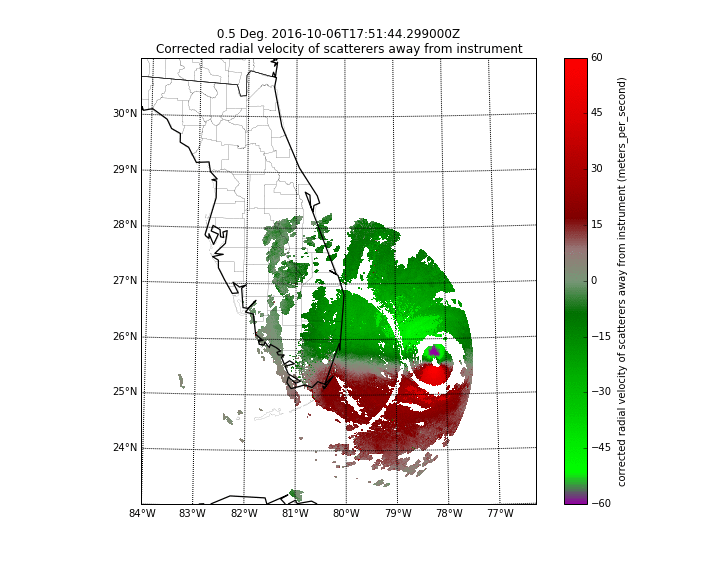

time: 36.1 ms


In [10]:
with open('/home/zsherman/pyart_animation/kamx_corrected_velocity_animation.gif','rb') as f:
    display(Image(f.read()), format='png')

In [11]:
#def animate(nframe, field, sweep, vmin, vmax, cmap)

time: 439 µs


In [13]:
#Now as Hurricane Matthew heads up the coast let's choose later dates and the next nearest nexrad site.
my_radars_kmlb = nexrad_site_datetime_span('20161007_045000', '20161007_115000',
                                           .333, 'KMLB')

[datetime.datetime(2016, 10, 7, 4, 50), datetime.datetime(2016, 10, 7, 5, 9, 58, 800000), datetime.datetime(2016, 10, 7, 5, 29, 57, 600000), datetime.datetime(2016, 10, 7, 5, 49, 56, 400000), datetime.datetime(2016, 10, 7, 6, 9, 55, 200000), datetime.datetime(2016, 10, 7, 6, 29, 54), datetime.datetime(2016, 10, 7, 6, 49, 52, 800000), datetime.datetime(2016, 10, 7, 7, 9, 51, 600000), datetime.datetime(2016, 10, 7, 7, 29, 50, 400000), datetime.datetime(2016, 10, 7, 7, 49, 49, 200000), datetime.datetime(2016, 10, 7, 8, 9, 48), datetime.datetime(2016, 10, 7, 8, 29, 46, 800000), datetime.datetime(2016, 10, 7, 8, 49, 45, 600000), datetime.datetime(2016, 10, 7, 9, 9, 44, 400000), datetime.datetime(2016, 10, 7, 9, 29, 43, 200000), datetime.datetime(2016, 10, 7, 9, 49, 42), datetime.datetime(2016, 10, 7, 10, 9, 40, 800000), datetime.datetime(2016, 10, 7, 10, 29, 39, 600000), datetime.datetime(2016, 10, 7, 10, 49, 38, 400000), datetime.datetime(2016, 10, 7, 11, 9, 37, 200000), datetime.datetime(

In [14]:
max_lat = 33
min_lat = 25
min_lon = -84
max_lon = -76

lal = np.arange(min_lat, max_lat, 1)
lol = np.arange(min_lon, max_lon, 1)

def animate(nframe):
    plt.clf()
    display = pyart.graph.RadarMapDisplay(my_radars_kmlb[nframe])
    display.plot_ppi_map('reflectivity', sweep=0, resolution='l',
                         vmin=-8, vmax = 64, mask_outside=False,
                         cmap=pyart.graph.cm.NWSRef,
                         min_lat=min_lat, min_lon=min_lon,
                         max_lat=max_lat, max_lon=max_lon,
                         lat_lines=lal, lon_lines=lol)
    display.basemap.drawcounties()
    
fig = plt.figure(figsize=(10, 8))
anim_kmlb = animation.FuncAnimation(fig, animate, frames=len(my_radars_kmlb))
anim_kmlb.save('/home/zsherman/pyart_animation/kmlb_reflectivity_animation.gif', 
               writer='imagemagick', fps=5)
plt.close()

time: 2min 12s


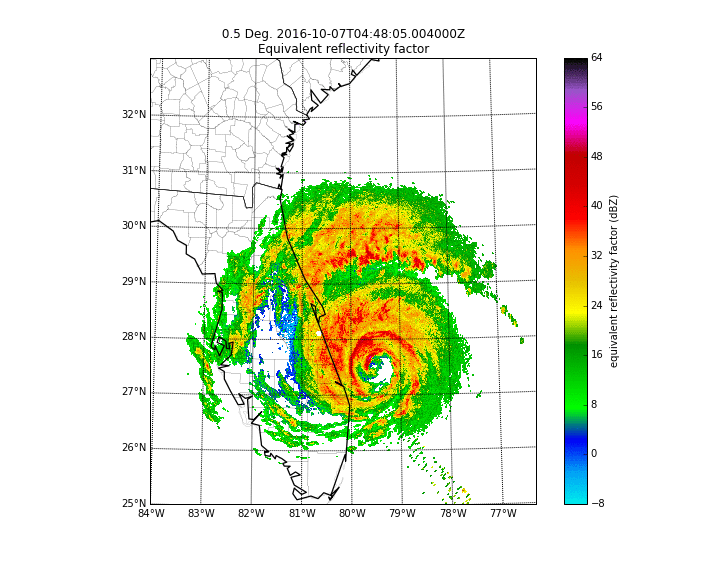

time: 32.7 ms


In [15]:
with open('/home/zsherman/pyart_animation/kmlb_reflectivity_animation.gif','rb') as f:
    display(Image(f.read()), format='png')

In [16]:
#One more site in Jacksonville as Hurricane Matthew heads to the Georgia coast.
my_radars_kjax = nexrad_site_datetime_span('20161007_115000', '20161007_165000',
                                           .333, 'KJAX')

[datetime.datetime(2016, 10, 7, 11, 50), datetime.datetime(2016, 10, 7, 12, 9, 58, 800000), datetime.datetime(2016, 10, 7, 12, 29, 57, 600000), datetime.datetime(2016, 10, 7, 12, 49, 56, 400000), datetime.datetime(2016, 10, 7, 13, 9, 55, 200000), datetime.datetime(2016, 10, 7, 13, 29, 54), datetime.datetime(2016, 10, 7, 13, 49, 52, 800000), datetime.datetime(2016, 10, 7, 14, 9, 51, 600000), datetime.datetime(2016, 10, 7, 14, 29, 50, 400000), datetime.datetime(2016, 10, 7, 14, 49, 49, 200000), datetime.datetime(2016, 10, 7, 15, 9, 48), datetime.datetime(2016, 10, 7, 15, 29, 46, 800000), datetime.datetime(2016, 10, 7, 15, 49, 45, 600000), datetime.datetime(2016, 10, 7, 16, 9, 44, 400000), datetime.datetime(2016, 10, 7, 16, 29, 43, 200000), datetime.datetime(2016, 10, 7, 16, 49, 42)]
time: 1min 40s


In [17]:
max_lat = 34
min_lat = 27
min_lon = -85
max_lon = -78

lal = np.arange(min_lat, max_lat, 1)
lol = np.arange(min_lon, max_lon, 1)

def animate(nframe):
    plt.clf()
    display = pyart.graph.RadarMapDisplay(my_radars_kjax[nframe])
    
    display.plot_ppi_map('reflectivity', sweep=0, resolution='l',
                         vmin=-8, vmax=64, mask_outside=False,
                         cmap=pyart.graph.cm.NWSRef,
                         min_lat=min_lat, min_lon=min_lon,
                         max_lat=max_lat, max_lon=max_lon,
                         lat_lines=lal, lon_lines=lol)
    display.basemap.drawcounties()
    
fig = plt.figure(figsize=(10, 8))
anim_kjax = animation.FuncAnimation(fig, animate, frames=len(my_radars_kjax))
anim_kjax.save('/home/zsherman/pyart_animation/kjax_reflectivity_animation.gif', 
               writer='imagemagick', fps=5)
plt.close()

time: 1min 45s


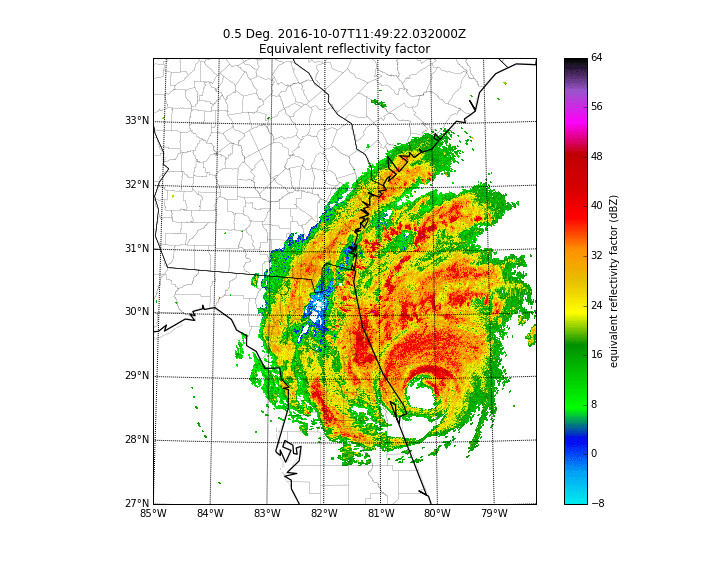

time: 28.1 ms


In [18]:
with open('/home/zsherman/pyart_animation/kjax_reflectivity_animation.gif','rb') as f:
    display(Image(f.read()), format='png')

In [19]:
#Now something closer to home.
#Day of tornadoes June 22nd, storm split near the chicago area.
my_radars_klot = nexrad_site_datetime_span('20160622_150000', '20160622_210000',
                                           .333, 'KLOT')
for my_radar_klot in my_radars_klot:
    nyq = my_radar_klot.instrument_parameters['nyquist_velocity']['data'][0]
    gatefilter = pyart.correct.GateFilter(my_radar_klot)
    gatefilter.exclude_masked('reflectivity')
    corr_vel = pyart.correct.dealias_region_based(
    my_radar_klot, vel_field='velocity', keep_original=False, 
    gatefilter = gatefilter, nyquist_vel=nyq, centered = True)
    my_radar_klot.add_field('corrected_velocity', corr_vel, replace_existing = True)

[datetime.datetime(2016, 6, 22, 15, 0), datetime.datetime(2016, 6, 22, 15, 19, 58, 800000), datetime.datetime(2016, 6, 22, 15, 39, 57, 600000), datetime.datetime(2016, 6, 22, 15, 59, 56, 400000), datetime.datetime(2016, 6, 22, 16, 19, 55, 200000), datetime.datetime(2016, 6, 22, 16, 39, 54), datetime.datetime(2016, 6, 22, 16, 59, 52, 800000), datetime.datetime(2016, 6, 22, 17, 19, 51, 600000), datetime.datetime(2016, 6, 22, 17, 39, 50, 400000), datetime.datetime(2016, 6, 22, 17, 59, 49, 200000), datetime.datetime(2016, 6, 22, 18, 19, 48), datetime.datetime(2016, 6, 22, 18, 39, 46, 800000), datetime.datetime(2016, 6, 22, 18, 59, 45, 600000), datetime.datetime(2016, 6, 22, 19, 19, 44, 400000), datetime.datetime(2016, 6, 22, 19, 39, 43, 200000), datetime.datetime(2016, 6, 22, 19, 59, 42), datetime.datetime(2016, 6, 22, 20, 19, 40, 800000), datetime.datetime(2016, 6, 22, 20, 39, 39, 600000), datetime.datetime(2016, 6, 22, 20, 59, 38, 400000)]


/home/zsherman/anaconda3/lib/python3.5/site-packages/pyart/correct/region_dealias.py:249: UserWarning: Velocities outside of the Nyquist interval found in sweep 1.
  warnings.warn(msg, UserWarning)


time: 4min


In [20]:
def animate(nframe):
    plt.clf()
    display = pyart.graph.RadarMapDisplay(my_radars_klot[nframe])
    
    display.plot_ppi_map('reflectivity', sweep =0, resolution='l',
                         vmin=-8, vmax=64, mask_outside=False,
                         cmap=pyart.graph.cm.NWSRef,
                         lat_lines=None, lon_lines=None)
    display.basemap.drawcounties()
    
fig = plt.figure(figsize=(10, 8))
anim_klot = animation.FuncAnimation(fig, animate, frames=len(my_radars_klot))
anim_klot.save('/home/zsherman/pyart_animation/klot_reflectivity_animation.gif', 
               writer='imagemagick', fps=5)
plt.close()

time: 2min 30s


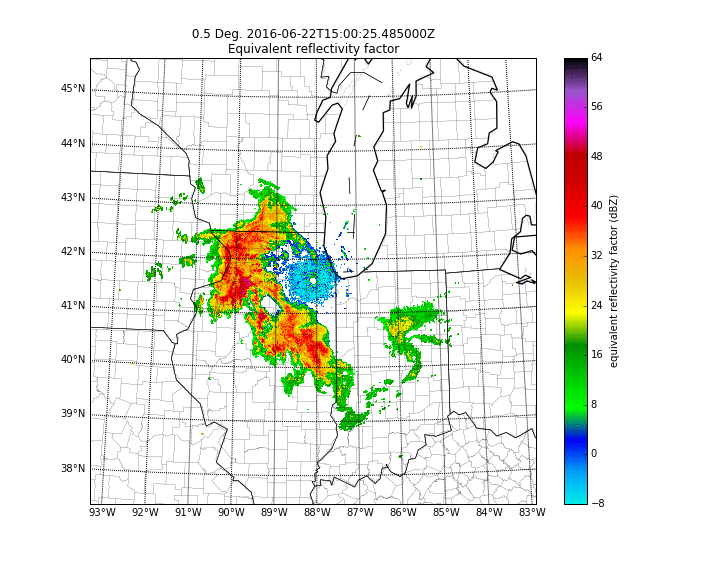

time: 46.2 ms


In [22]:
with open('/home/zsherman/pyart_animation/klot_reflectivity_animation.gif','rb') as f:
    display(Image(f.read()), format='png')

In [26]:
def animate(nframe):
    plt.clf()
    display = pyart.graph.RadarMapDisplay(my_radars_klot[nframe])
    
    display.plot_ppi_map('velocity', sweep=1, resolution='l',
                         vmin=-60, vmax=60, mask_outside=False,
                         cmap=pyart.graph.cm.NWSVel,
                         lat_lines=None, lon_lines=None)
    display.basemap.drawcounties()
    
fig = plt.figure(figsize=(10, 8))
anim_klot = animation.FuncAnimation(fig, animate, frames=len(my_radars_klot))
anim_klot.save('/home/zsherman/pyart_animation/klot_velocity_animation.gif', 
               writer='imagemagick', fps=5)
plt.close()

time: 2min 31s


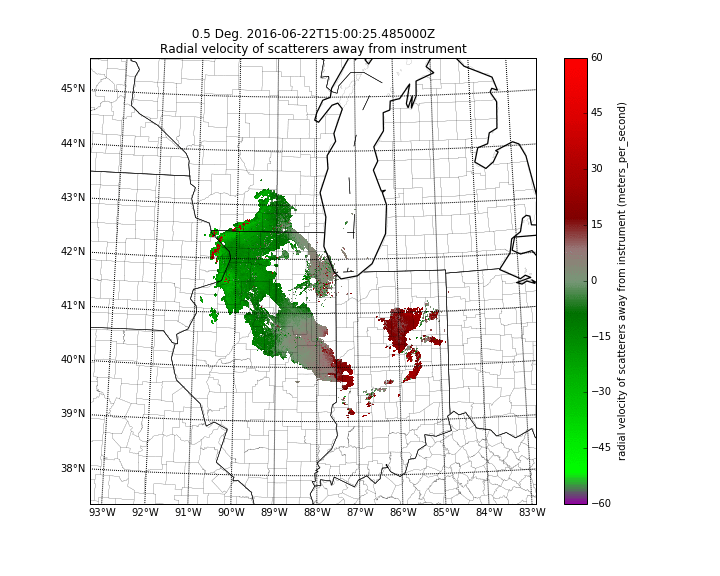

time: 24.4 ms


In [27]:
with open('/home/zsherman/pyart_animation/klot_velocity_animation.gif','rb') as f:
    display(Image(f.read()), format='png')